In [8]:
# Importer les libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import tweepy
import pandas as pd
#from dataprep.eda import create_report
import contractions
import re
import string
from textblob import TextBlob
from nltk.tokenize import word_tokenize
import nltk

nltk.download("stopwords")
from nltk.corpus import stopwords
stop = set(stopwords.words('english'))
nltk.download('brown')
from nltk.stem import WordNetLemmatizer
from nltk.sentiment.vader import SentimentIntensityAnalyzer
nltk.download('vader_lexicon')
from wordcloud import WordCloud
import gensim
from gensim import corpora
from gensim.models import CoherenceModel
import warnings
warnings.filterwarnings("ignore")
import pyLDAvis
import pyLDAvis.gensim #dont skip this
from gensim.utils import simple_preprocess
import time
from tweepy.auth import OAuthHandler
import jsonpickle
import csv
import time
stop_words = stopwords.words('english')
import os

import pyLDAvis.gensim_models as gensimvis
import pickle 



[nltk_data] Downloading package stopwords to /home/vscode/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package brown to /home/vscode/nltk_data...
[nltk_data]   Package brown is already up-to-date!
[nltk_data] Downloading package vader_lexicon to
[nltk_data]     /home/vscode/nltk_data...
[nltk_data]   Package vader_lexicon is already up-to-date!


In [9]:
# Importer le dataset
data_fake=pd.read_csv('fake_or_real_news.csv')

In [10]:
data_fake

,Unnamed: 0,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...,...
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL


In [11]:
data_fake.head(5)

,Unnamed: 0,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL


In [5]:
data_fake.shape

(6335, 4)

In [6]:
data_fake.columns

Index(['Unnamed: 0', 'title', 'text', 'label'], dtype='object')

In [7]:
data_fake = data_fake.rename(columns={"Unnamed: 0": "tweet_id"})

In [8]:
data_fake

,tweet_id,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...,...
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL


In [9]:
data_fake.to_csv("new_fake_or_real_news.csv", index=False)

In [10]:
data_fake=pd.read_csv('new_fake_or_real_news.csv')

In [11]:
data_fake

,tweet_id,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...,...
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL


In [12]:
data_fake.shape

(6335, 4)

# Twitter Api Streaming

In [13]:
def classify_tweet(tweet_text):
    real_news_keywords = ["breaking news", "latest news", "developing story"]
    fake_news_keywords = ["hoax", "fake", "conspiracy"]

    for keyword in real_news_keywords:
        if keyword in tweet_text.lower():
            return "REAL"

    for keyword in fake_news_keywords:
        if keyword in tweet_text.lower():
            return "FAKE"

    return "unknown"

In [14]:
st = time.time()

In [15]:
consumer_key = "nV211cauWjRmdu9a613t7bXON"
consumer_secret = "BhUXQCxACTexmi0Y1A7qvpLaAKrIKfnJCphlWYhjTmP33wNYkb"
access_token = "4559785366-e3uLZEyJhIxTf4Gu01s99FS1CnZ5cONLiUmyj4C"
access_token_secret =  "etuvGy3TxNjuua0NDNu1WgyfenNgauhSXtSxLRl729Qpl"
auth = tweepy.OAuthHandler(consumer_key, consumer_secret)
auth.set_access_token(access_token, access_token_secret)
api = tweepy.API(auth)

C:\Users\Mayssa\anaconda3\lib\site-packages\tweepy\auth.py:120: DeprecationWarning: OAuthHandler is deprecated; use OAuth1UserHandler instead.
  warnings.warn(


In [16]:
tweetsPerQuery = 10 #this is the maximum provided by API
max_tweets = 5000 # just for the sake of While loop
fName = 'tweets.txt' # where i save the tweets
search_query=[ "real news OR fake news"]

In [17]:
#No sinceId and max_id ..Get whathever you have exhaustively
since_id = None
max_id = -1
tweet_count = 0
print("Downloading the tweeets for Search Query..takes some time..")

x=0
with open(fName,'w') as f:
    print("Downloading hashtag")
    while(tweet_count<max_tweets):
        try:
            if(max_id<=0):
                if(not since_id):
                    new_tweets = api.search_tweets(q=search_query,count=tweetsPerQuery,lang="en",tweet_mode='extended')

                else:
                    new_tweets = api.search_tweets(q=search_query,count=tweetsPerQuery,lang="en",tweet_mode='extended',since_id=since_id)
            else:
                if(not since_id):
                    new_tweets = api.search_tweets(q=search_query,count=tweetsPerQuery,lang="en",tweet_mode='extended',max_id=str(max_id-1))
                else:
                    new_tweets = api.search_tweets(q=search_query,count=tweetsPerQuery,lang="en",tweet_mode='extended',max_id=str(max_id-1),since_id=since_id)

            # Tweets Exhausted
            if(not new_tweets):
                print("No more tweets found!!")
                break
            # write all the new_tweets to a json file
            for tweet in new_tweets:
                f.write(jsonpickle.encode(tweet._json,unpicklable=False)+'\n')
                tweet_count+=len(new_tweets)
                print("Successfully downloaded {0} tweets".format(tweet_count))
                max_id=new_tweets[-1].id
        # in case of any error
        except tweepy.errors.TweepError as e:
                print("Some error!!:"+str(e))
                break
end = time.time()

print("A total of {0} tweets are downloaded and saved to {1}".format(tweet_count,fName))
print("Total time taken is ",end-st,"seconds.")

Successfully downloaded 10 tweets
Successfully downloaded 20 tweets
Successfully downloaded 30 tweets
Successfully downloaded 40 tweets
Successfully downloaded 50 tweets
Successfully downloaded 60 tweets
Successfully downloaded 70 tweets
Successfully downloaded 80 tweets
Successfully downloaded 90 tweets
Successfully downloaded 100 tweets
Successfully downloaded 110 tweets
Successfully downloaded 120 tweets
Successfully downloaded 130 tweets
Successfully downloaded 140 tweets
Successfully downloaded 150 tweets
Successfully downloaded 160 tweets
Successfully downloaded 170 tweets
Successfully downloaded 180 tweets
Successfully downloaded 190 tweets
Successfully downloaded 200 tweets
Successfully downloaded 210 tweets
Successfully downloaded 220 tweets
Successfully downloaded 230 tweets
Successfully downloaded 240 tweets
Successfully downloaded 250 tweets
Successfully downloaded 260 tweets
Successfully downloaded 270 tweets
Successfully downloaded 280 tweets
Successfully downloaded 290 t

Successfully downloaded 2310 tweets
Successfully downloaded 2320 tweets
Successfully downloaded 2330 tweets
Successfully downloaded 2340 tweets
Successfully downloaded 2350 tweets
Successfully downloaded 2360 tweets
Successfully downloaded 2370 tweets
Successfully downloaded 2380 tweets
Successfully downloaded 2390 tweets
Successfully downloaded 2400 tweets
Successfully downloaded 2410 tweets
Successfully downloaded 2420 tweets
Successfully downloaded 2430 tweets
Successfully downloaded 2440 tweets
Successfully downloaded 2450 tweets
Successfully downloaded 2460 tweets
Successfully downloaded 2470 tweets
Successfully downloaded 2480 tweets
Successfully downloaded 2490 tweets
Successfully downloaded 2500 tweets
Successfully downloaded 2510 tweets
Successfully downloaded 2520 tweets
Successfully downloaded 2530 tweets
Successfully downloaded 2540 tweets
Successfully downloaded 2550 tweets
Successfully downloaded 2560 tweets
Successfully downloaded 2570 tweets
Successfully downloaded 2580

Successfully downloaded 4610 tweets
Successfully downloaded 4620 tweets
Successfully downloaded 4630 tweets
Successfully downloaded 4640 tweets
Successfully downloaded 4650 tweets
Successfully downloaded 4660 tweets
Successfully downloaded 4670 tweets
Successfully downloaded 4680 tweets
Successfully downloaded 4690 tweets
Successfully downloaded 4700 tweets
Successfully downloaded 4710 tweets
Successfully downloaded 4720 tweets
Successfully downloaded 4730 tweets
Successfully downloaded 4740 tweets
Successfully downloaded 4750 tweets
Successfully downloaded 4760 tweets
Successfully downloaded 4770 tweets
Successfully downloaded 4780 tweets
Successfully downloaded 4790 tweets
Successfully downloaded 4800 tweets
Successfully downloaded 4810 tweets
Successfully downloaded 4820 tweets
Successfully downloaded 4830 tweets
Successfully downloaded 4840 tweets
Successfully downloaded 4850 tweets
Successfully downloaded 4860 tweets
Successfully downloaded 4870 tweets
Successfully downloaded 4880

In [13]:
import json
import csv

f = open('new_fake_or_real_news.csv','a',encoding='utf-8')
csvWriter = csv.writer(f)
headers=['tweet_id','title','text','label']
csvWriter.writerow(headers)

for inputFile in ['tweets.txt']:#all the text-file names you want to convert to Csv in the see folder as this code
    tweets = []
    for line in open(inputFile, 'r'):
        tweets.append(json.loads(line))

    print('HI',len(tweets))
    count_lines=0
    for tweet in tweets:
        try:
            csvWriter.writerow([tweet['id_str'],tweet['full_text'].split(":")[0],tweet['full_text'],classify_tweet(tweet['full_text'])])
            count_lines+=1
        except Exception as e:
            print(e)
    print(count_lines)

HI 500
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not defined
name 'classify_tweet' is not de

In [14]:
data_fake_real = pd.read_csv('new_fake_or_real_news.csv')

In [15]:
data_fake_real.shape

(6335, 4)

In [16]:
data_fake_real = data_fake_real[data_fake_real['label'] != 'unknown']
data_fake_real = data_fake_real[data_fake_real['label'] != 'label']

# Data Understanding



In [17]:
data_fake_real

,tweet_id,title,text,label
0,8476,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,10294,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,3608,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,10142,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,875,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...,...
6330,4490,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6331,8062,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6332,8622,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6333,4021,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL


In [18]:
data_fake_real.shape

(6335, 4)

In [19]:
data_fake_real.describe()

,tweet_id
count,6335.000000
mean,5280.415627
std,3038.503953
min,2.000000
25%,2674.500000
50%,5271.000000
75%,7901.000000
max,10557.000000


In [20]:
data_fake_real.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 6335 entries, 0 to 6334
Data columns (total 4 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   tweet_id  6335 non-null   int64 
 1   title     6335 non-null   object
 2   text      6335 non-null   object
 3   label     6335 non-null   object
dtypes: int64(1), object(3)
memory usage: 247.5+ KB


In [21]:
data_fake_real.drop(columns=['tweet_id'],inplace=True)

In [22]:
data_fake_real["label"].value_counts()

REAL    3171
FAKE    3164
Name: label, dtype: int64

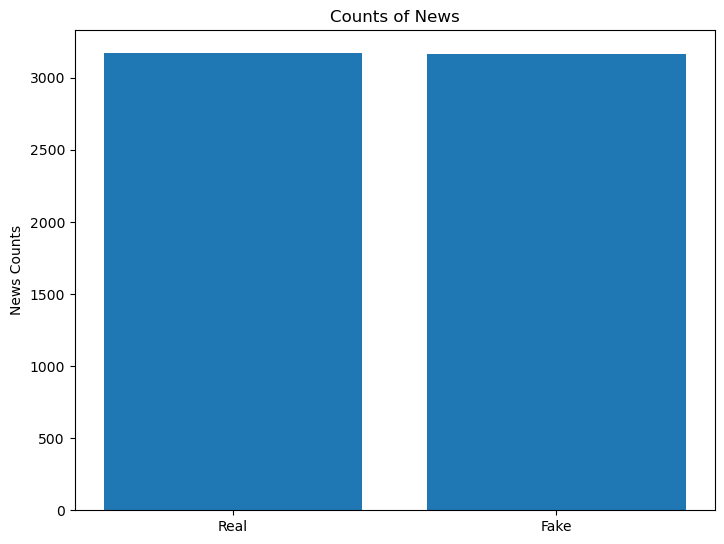

In [23]:
fig = plt.figure()
# plt.figure(figsize=(1,1))
ax = fig.add_axes([0,0,1,1])
labels = ['Real','Fake']
ax.bar(labels,data_fake_real['label'].value_counts())
plt.ylabel('News Counts')
plt.title('Counts of News')
plt.show()

In [24]:
data_fake_real.isnull().sum()

title    0
text     0
label    0
dtype: int64

In [25]:
bool_series = data_fake_real.duplicated()
#####data_agency.drop_duplicates
bool_series
print(bool_series.describe())
data_fake_real.index.is_unique

count      6335
unique        2
top       False
freq       6306
dtype: object


True

In [26]:
data_fake_real = data_fake_real.drop_duplicates()

In [27]:
data_fake_real = data_fake_real.reset_index(drop=True)

In [28]:
#create_report(data_fake_real).show()

In [29]:
data_stat = data_fake_real.copy()

In [30]:
data_stat

,title,text,label
0,You Can Smell Hillary’s Fear,"Daniel Greenfield, a Shillman Journalism Fello...",FAKE
1,Watch The Exact Moment Paul Ryan Committed Pol...,Google Pinterest Digg Linkedin Reddit Stumbleu...,FAKE
2,Kerry to go to Paris in gesture of sympathy,U.S. Secretary of State John F. Kerry said Mon...,REAL
3,Bernie supporters on Twitter erupt in anger ag...,"— Kaydee King (@KaydeeKing) November 9, 2016 T...",FAKE
4,The Battle of New York: Why This Primary Matters,It's primary day in New York and front-runners...,REAL
...,...,...,...
6301,State Department says it can't find emails fro...,The State Department told the Republican Natio...,REAL
6302,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...,FAKE
6303,Anti-Trump Protesters Are Tools of the Oligarc...,Anti-Trump Protesters Are Tools of the Oligar...,FAKE
6304,"In Ethiopia, Obama seeks progress on peace, se...","ADDIS ABABA, Ethiopia —President Obama convene...",REAL


In [31]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()
data_stat['label'] = encoder.fit_transform(data_stat['label'])

In [32]:
data_stat['num_characters'] = data_stat['text'].apply(len)

In [33]:
data_stat['num_words'] = data_stat['text'].apply(lambda x:len(nltk.word_tokenize(x)))

In [34]:
data_stat['num_sentences'] = data_stat['text'].apply(lambda x:len(nltk.sent_tokenize(x)))

<AxesSubplot:xlabel='num_characters', ylabel='Count'>

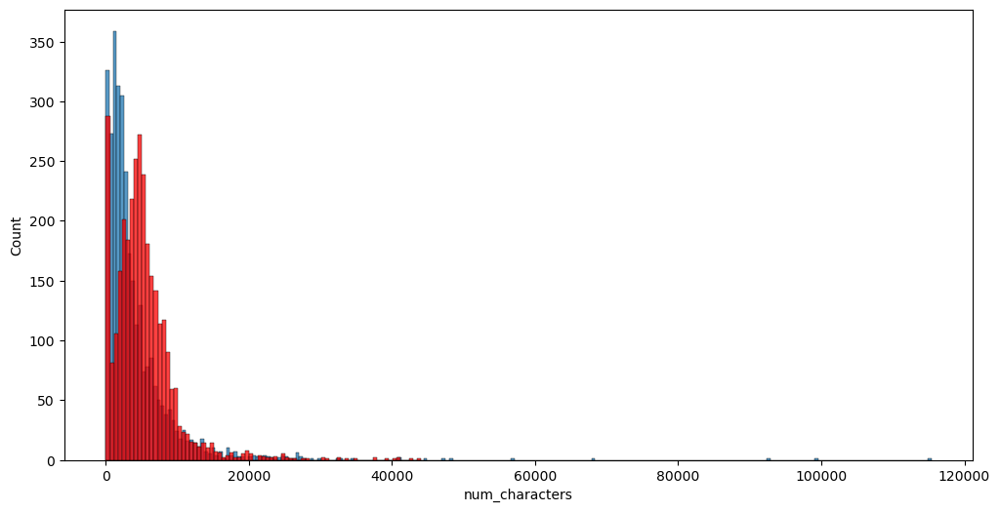

In [35]:
plt.figure(figsize=(12,6))
sns.histplot(data_stat[data_stat['label'] == 0]['num_characters'])
sns.histplot(data_stat[data_stat['label'] == 1]['num_characters'],color='red')

<AxesSubplot:xlabel='num_words', ylabel='Count'>

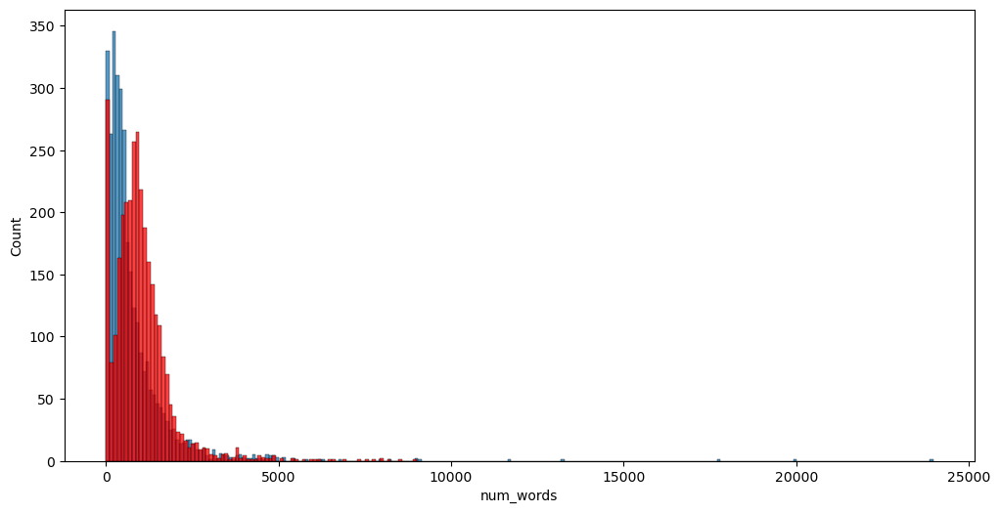

In [36]:
plt.figure(figsize=(12,6))
sns.histplot(data_stat[data_stat['label'] == 0]['num_words'])
sns.histplot(data_stat[data_stat['label'] == 1]['num_words'],color='red')

<AxesSubplot:>

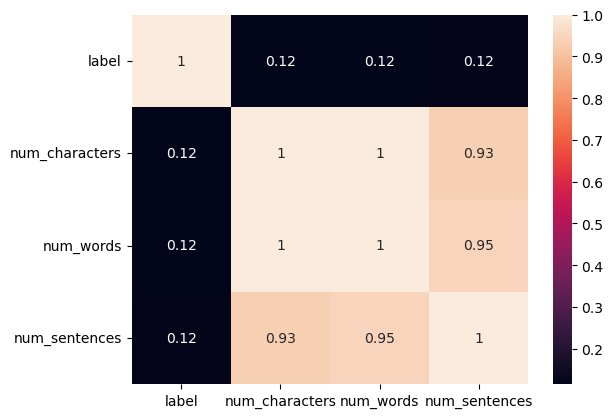

In [37]:
sns.heatmap(data_stat.corr(),annot=True)

# Data Preparation

## Text Cleaning:

In [38]:
data_fake_real["text"]

0       Daniel Greenfield, a Shillman Journalism Fello...
1       Google Pinterest Digg Linkedin Reddit Stumbleu...
2       U.S. Secretary of State John F. Kerry said Mon...
3       — Kaydee King (@KaydeeKing) November 9, 2016 T...
4       It's primary day in New York and front-runners...
                              ...                        
6301    The State Department told the Republican Natio...
6302    The ‘P’ in PBS Should Stand for ‘Plutocratic’ ...
6303     Anti-Trump Protesters Are Tools of the Oligar...
6304    ADDIS ABABA, Ethiopia —President Obama convene...
6305    Jeb Bush Is Suddenly Attacking Trump. Here's W...
Name: text, Length: 6306, dtype: object

In [46]:
import spacy

# Load the model with the desired language
nlp = spacy.load("en_core_web_sm")

# Define a function to detect and translate non-English text
def translate_text(text):
    # Detect the language of the text
    doc = nlp(text)
    detected_language = doc.lang_
    
    # Translate the text to English if it's not already in English
    if detected_language != "en":
        translation = doc._.translation["en"]
    else:
        translation = text
    
    return translation


C:\Users\Mayssa\anaconda3\lib\site-packages\tensorflow\core\framework\tensor_shape_pb2.py:18: DeprecationWarning: Call to deprecated create function FileDescriptor(). Note: Create unlinked descriptors is going to go away. Please use get/find descriptors from generated code or query the descriptor_pool.
  DESCRIPTOR = _descriptor.FileDescriptor(
C:\Users\Mayssa\anaconda3\lib\site-packages\tensorflow\core\framework\tensor_shape_pb2.py:36: DeprecationWarning: Call to deprecated create function FieldDescriptor(). Note: Create unlinked descriptors is going to go away. Please use get/find descriptors from generated code or query the descriptor_pool.
  _descriptor.FieldDescriptor(
C:\Users\Mayssa\anaconda3\lib\site-packages\tensorflow\core\framework\tensor_shape_pb2.py:43: DeprecationWarning: Call to deprecated create function FieldDescriptor(). Note: Create unlinked descriptors is going to go away. Please use get/find descriptors from generated code or query the descriptor_pool.
  _descripto

In [1]:
# Apply the translate_text function to the 'text' column of the DataFrame
data_fake_real["text"] = data_fake_real["text"].apply(translate_text)

### LowerCase

In [39]:
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: x.lower())

In [40]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       u.s. secretary of state john f. kerry said mon...
3       — kaydee king (@kaydeeking) november 9, 2016 t...
4       it's primary day in new york and front-runners...
                              ...                        
6301    the state department told the republican natio...
6302    the ‘p’ in pbs should stand for ‘plutocratic’ ...
6303     anti-trump protesters are tools of the oligar...
6304    addis ababa, ethiopia —president obama convene...
6305    jeb bush is suddenly attacking trump. here's w...
Name: text, Length: 6306, dtype: object

### Expand the Contractions

In [41]:
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: contractions.fix(x))

### Remove URLs

In [42]:
def remove_URL(text):
    """
        Remove URLs from a sample string
    """
    return re.sub(r"https?://\S+|www\.\S+", "", text)

In [43]:
# remove urls from the text
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: remove_URL(x))

### Remove HTML tags

In [44]:
def remove_html(text):
    """
        Remove the html in sample text
    """
    html = re.compile(r"<.*?>|&([a-z0-9]+|#[0-9]{1,6}|#x[0-9a-f]{1,6});")
    return re.sub(html, "", text)

In [45]:
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: remove_html(x))


In [46]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       you.s. secretary of state john f. kerry said m...
3       — kaydee king (@kaydeeking) november 9, 2016 t...
4       it is primary day in new york and front-runner...
                              ...                        
6301    the state department told the republican natio...
6302    the ‘p’ in pbs should stand for ‘plutocratic’ ...
6303     anti-trump protesters are tools of the oligar...
6304    addis ababa, ethiopia —president obama convene...
6305    jeb bush is suddenly attacking trump. here is ...
Name: text, Length: 6306, dtype: object

### Remove Non-ASCI:

In [47]:
def remove_non_ascii(text):
    """
        Remove non-ASCII characters 
    """
    return re.sub(r'[^\x00-\x7f]',r'', text) # or ''.join([x for x in text if x in string.printable]) 

In [48]:
# remove non-ascii characters from the text
data_fake_real["text"]= data_fake_real["text"].apply(lambda x: remove_non_ascii(x))

### Remove special characters:

In [49]:
def remove_special_characters(text):
    """
        Remove special special characters, including symbols, emojis, and other graphic characters
    """
    emoji_pattern = re.compile(
        '['
        u'\U0001F600-\U0001F64F'  # emoticons
        u'\U0001F300-\U0001F5FF'  # symbols & pictographs
        u'\U0001F680-\U0001F6FF'  # transport & map symbols
        u'\U0001F1E0-\U0001F1FF'  # flags (iOS)
        u'\U00002702-\U000027B0'
        u'\U000024C2-\U0001F251'
        ']+',
        flags=re.UNICODE)
    return emoji_pattern.sub(r'', text)

In [50]:
data_fake_real["text"]= data_fake_real["text"].apply(lambda x: remove_special_characters(x))

In [51]:
data_fake_real["text"]

0       daniel greenfield, a shillman journalism fello...
1       google pinterest digg linkedin reddit stumbleu...
2       you.s. secretary of state john f. kerry said m...
3        kaydee king (@kaydeeking) november 9, 2016 th...
4       it is primary day in new york and front-runner...
                              ...                        
6301    the state department told the republican natio...
6302    the p in pbs should stand for plutocratic or p...
6303     anti-trump protesters are tools of the oligar...
6304    addis ababa, ethiopia president obama convened...
6305    jeb bush is suddenly attacking trump. here is ...
Name: text, Length: 6306, dtype: object

### Remove punctuations:

In [52]:
def remove_punct(text):
    """
        Remove the punctuation
    """
#     return re.sub(r'[]!"$%&\'()*+,./:;=#@?[\\^_`{|}~-]+', "", text)
    return text.translate(str.maketrans('', '', string.punctuation))

In [53]:
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: remove_punct(x))

In [54]:
data_fake_real["text"]

0       daniel greenfield a shillman journalism fellow...
1       google pinterest digg linkedin reddit stumbleu...
2       yous secretary of state john f kerry said mond...
3        kaydee king kaydeeking november 9 2016 the le...
4       it is primary day in new york and frontrunners...
                              ...                        
6301    the state department told the republican natio...
6302    the p in pbs should stand for plutocratic or p...
6303     antitrump protesters are tools of the oligarc...
6304    addis ababa ethiopia president obama convened ...
6305    jeb bush is suddenly attacking trump here is w...
Name: text, Length: 6306, dtype: object

### Replace the Typos, slang, acronyms or informal abbreviations

In [55]:
def other_clean(text):
        """
            Other manual text cleaning techniques
        """
        # Typos, slang and other
        sample_typos_slang = {
                                "w/e": "whatever",
                                "usagov": "usa government",
                                "recentlu": "recently",
                                "ph0tos": "photos",
                                "amirite": "am i right",
                                "exp0sed": "exposed",
                                "<3": "love",
                                "luv": "love",
                                "amageddon": "armageddon",
                                "trfc": "traffic",
                                "16yr": "16 year"
                                }

        # Acronyms
        sample_acronyms =  { 
                            "mh370": "malaysia airlines flight 370",
                            "okwx": "oklahoma city weather",
                            "arwx": "arkansas weather",    
                            "gawx": "georgia weather",  
                            "scwx": "south carolina weather",  
                            "cawx": "california weather",
                            "tnwx": "tennessee weather",
                            "azwx": "arizona weather",  
                            "alwx": "alabama weather",
                            "usnwsgov": "united states national weather service",
                            "2mw": "tomorrow"
                            }

        
        # Some common abbreviations 
        sample_abbr = {
                        "$" : " dollar ",
                        "€" : " euro ",
                        "4ao" : "for adults only",
                        "a.m" : "before midday",
                        "a3" : "anytime anywhere anyplace",
                        "aamof" : "as a matter of fact",
                        "acct" : "account",
                        "adih" : "another day in hell",
                        "afaic" : "as far as i am concerned",
                        "afaict" : "as far as i can tell",
                        "afaik" : "as far as i know",
                        "afair" : "as far as i remember",
                        "afk" : "away from keyboard",
                        "app" : "application",
                        "approx" : "approximately",
                        "apps" : "applications",
                        "asap" : "as soon as possible",
                        "asl" : "age, sex, location",
                        "atk" : "at the keyboard",
                        "ave." : "avenue",
                        "aymm" : "are you my mother",
                        "ayor" : "at your own risk", 
                        "b&b" : "bed and breakfast",
                        "b+b" : "bed and breakfast",
                        "b.c" : "before christ",
                        "b2b" : "business to business",
                        "b2c" : "business to customer",
                        "b4" : "before",
                        "b4n" : "bye for now",
                        "b@u" : "back at you",
                        "bae" : "before anyone else",
                        "bak" : "back at keyboard",
                        "bbbg" : "bye bye be good",
                        "bbc" : "british broadcasting corporation",
                        "bbias" : "be back in a second",
                        "bbl" : "be back later",
                        "bbs" : "be back soon",
                        "be4" : "before",
                        "bfn" : "bye for now",
                        "blvd" : "boulevard",
                        "bout" : "about",
                        "brb" : "be right back",
                        "bros" : "brothers",
                        "brt" : "be right there",
                        "bsaaw" : "big smile and a wink",
                        "btw" : "by the way",
                        "bwl" : "bursting with laughter",
                        "c/o" : "care of",
                        "cet" : "central european time",
                        "cf" : "compare",
                        "cia" : "central intelligence agency",
                        "csl" : "can not stop laughing",
                        "cu" : "see you",
                        "cul8r" : "see you later",
                        "cv" : "curriculum vitae",
                        "cwot" : "complete waste of time",
                        "cya" : "see you",
                        "cyt" : "see you tomorrow",
                        "dae" : "does anyone else",
                        "dbmib" : "do not bother me i am busy",
                        "diy" : "do it yourself",
                        "dm" : "direct message",
                        "dwh" : "during work hours",
                        "e123" : "easy as one two three",
                        "eet" : "eastern european time",
                        "eg" : "example",
                        "embm" : "early morning business meeting",
                        "encl" : "enclosed",
                        "encl." : "enclosed",
                        "etc" : "and so on",
                        "faq" : "frequently asked questions",
                        "fawc" : "for anyone who cares",
                        "fb" : "facebook",
                        "fc" : "fingers crossed",
                        "fig" : "figure",
                        "fimh" : "forever in my heart", 
                        "ft." : "feet",
                        "ft" : "featuring",
                        "ftl" : "for the loss",
                        "ftw" : "for the win",
                        "fwiw" : "for what it is worth",
                        "fyi" : "for your information",
                        "g9" : "genius",
                        "gahoy" : "get a hold of yourself",
                        "gal" : "get a life",
                        "gcse" : "general certificate of secondary education",
                        "gfn" : "gone for now",
                        "gg" : "good game",
                        "gl" : "good luck",
                        "glhf" : "good luck have fun",
                        "gmt" : "greenwich mean time",
                        "gmta" : "great minds think alike",
                        "gn" : "good night",
                        "g.o.a.t" : "greatest of all time",
                        "goat" : "greatest of all time",
                        "goi" : "get over it",
                        "gps" : "global positioning system",
                        "gr8" : "great",
                        "gratz" : "congratulations",
                        "gyal" : "girl",
                        "h&c" : "hot and cold",
                        "hp" : "horsepower",
                        "hr" : "hour",
                        "hrh" : "his royal highness",
                        "ht" : "height",
                        "ibrb" : "i will be right back",
                        "ic" : "i see",
                        "icq" : "i seek you",
                        "icymi" : "in case you missed it",
                        "idc" : "i do not care",
                        "idgadf" : "i do not give a damn fuck",
                        "idgaf" : "i do not give a fuck",
                        "idk" : "i do not know",
                        "ie" : "that is",
                        "i.e" : "that is",
                        "ifyp" : "i feel your pain",
                        "IG" : "instagram",
                        "iirc" : "if i remember correctly",
                        "ilu" : "i love you",
                        "ily" : "i love you",
                        "imho" : "in my humble opinion",
                        "imo" : "in my opinion",
                        "imu" : "i miss you",
                        "iow" : "in other words",
                        "irl" : "in real life",
                        "j4f" : "just for fun",
                        "jic" : "just in case",
                        "jk" : "just kidding",
                        "jsyk" : "just so you know",
                        "l8r" : "later",
                        "lb" : "pound",
                        "lbs" : "pounds",
                        "ldr" : "long distance relationship",
                        "lmao" : "laugh my ass off",
                        "lmfao" : "laugh my fucking ass off",
                        "lol" : "laughing out loud",
                        "ltd" : "limited",
                        "ltns" : "long time no see",
                        "m8" : "mate",
                        "mf" : "motherfucker",
                        "mfs" : "motherfuckers",
                        "mfw" : "my face when",
                        "mofo" : "motherfucker",
                        "mph" : "miles per hour",
                        "mr" : "mister",
                        "mrw" : "my reaction when",
                        "ms" : "miss",
                        "mte" : "my thoughts exactly",
                        "nagi" : "not a good idea",
                        "nbc" : "national broadcasting company",
                        "nbd" : "not big deal",
                        "nfs" : "not for sale",
                        "ngl" : "not going to lie",
                        "nhs" : "national health service",
                        "nrn" : "no reply necessary",
                        "nsfl" : "not safe for life",
                        "nsfw" : "not safe for work",
                        "nth" : "nice to have",
                        "nvr" : "never",
                        "nyc" : "new york city",
                        "oc" : "original content",
                        "og" : "original",
                        "ohp" : "overhead projector",
                        "oic" : "oh i see",
                        "omdb" : "over my dead body",
                        "omg" : "oh my god",
                        "omw" : "on my way",
                        "p.a" : "per annum",
                        "p.m" : "after midday",
                        "pm" : "prime minister",
                        "poc" : "people of color",
                        "pov" : "point of view",
                        "pp" : "pages",
                        "ppl" : "people",
                        "prw" : "parents are watching",
                        "ps" : "postscript",
                        "pt" : "point",
                        "ptb" : "please text back",
                        "pto" : "please turn over",
                        "qpsa" : "what happens", #"que pasa",
                        "ratchet" : "rude",
                        "rbtl" : "read between the lines",
                        "rlrt" : "real life retweet", 
                        "rofl" : "rolling on the floor laughing",
                        "roflol" : "rolling on the floor laughing out loud",
                        "rotflmao" : "rolling on the floor laughing my ass off",
                        "rt" : "retweet",
                        "ruok" : "are you ok",
                        "sfw" : "safe for work",
                        "sk8" : "skate",
                        "smh" : "shake my head",
                        "sq" : "square",
                        "srsly" : "seriously", 
                        "ssdd" : "same stuff different day",
                        "tbh" : "to be honest",
                        "tbs" : "tablespooful",
                        "tbsp" : "tablespooful",
                        "tfw" : "that feeling when",
                        "thks" : "thank you",
                        "tho" : "though",
                        "thx" : "thank you",
                        "tia" : "thanks in advance",
                        "til" : "today i learned",
                        "tl;dr" : "too long i did not read",
                        "tldr" : "too long i did not read",
                        "tmb" : "tweet me back",
                        "tntl" : "trying not to laugh",
                        "ttyl" : "talk to you later",
                        "u" : "you",
                        "u2" : "you too",
                        "u4e" : "yours for ever",
                        "utc" : "coordinated universal time",
                        "w/" : "with",
                        "w/o" : "without",
                        "w8" : "wait",
                        "wassup" : "what is up",
                        "wb" : "welcome back",
                        "wtf" : "what the fuck",
                        "wtg" : "way to go",
                        "wtpa" : "where the party at",
                        "wuf" : "where are you from",
                        "wuzup" : "what is up",
                        "wywh" : "wish you were here",
                        "yd" : "yard",
                        "ygtr" : "you got that right",
                        "ynk" : "you never know",
                        "zzz" : "sleeping bored and tired"
                        }
            
        sample_typos_slang_pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in sample_typos_slang.keys()) + r')(?!\w)')
        sample_acronyms_pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in sample_acronyms.keys()) + r')(?!\w)')
        sample_abbr_pattern = re.compile(r'(?<!\w)(' + '|'.join(re.escape(key) for key in sample_abbr.keys()) + r')(?!\w)')
        
        text = sample_typos_slang_pattern.sub(lambda x: sample_typos_slang[x.group()], text)
        text = sample_acronyms_pattern.sub(lambda x: sample_acronyms[x.group()], text)
        text = sample_abbr_pattern.sub(lambda x: sample_abbr[x.group()], text)
        
        return text

In [56]:
# remove punctuations from the text
data_fake_real["text"] = data_fake_real["text"].apply(lambda x: other_clean(x))

In [57]:
data_fake_real["text"]

0       daniel greenfield a shillman journalism fellow...
1       google pinterest digg linkedin reddit stumbleu...
2       yous secretary of state john f kerry said mond...
3        kaydee king kaydeeking november 9 2016 the le...
4       it is primary day in new york and frontrunners...
                              ...                        
6301    the state department told the republican natio...
6302    the p in pbs should stand for plutocratic or p...
6303     antitrump protesters are tools of the oligarc...
6304    addis ababa ethiopia president obama convened ...
6305    jeb bush is suddenly attacking trump here is w...
Name: text, Length: 6306, dtype: object

### Spelling Correction

In [76]:
def correct_spelling(text):
    return TextBlob(text).correct()

In [1]:
data_fake_real['text'] = data_fake_real['text'].apply(lambda x: correct_spelling(x))


#### Remove \n


In [58]:
data_fake_real['text']  = data_fake_real['text'] .apply(lambda x: re.sub('\n','', x))

#### Remove Non-English characters

In [59]:
data_fake_real['text']= data_fake_real['text'].apply(lambda x: re.sub(r'[^\x00-\x7f]',r'', x))

#### Verification

In [60]:
def clean_text(text):
    text = text.lower()
    text = re.sub(r"don't", "do not", text)
    text = re.sub(r"isn't", "is not", text)
    text = re.sub(r"aren't", "are not", text)
    text = re.sub(r'''(?i)\b((?:https?://|www\d{0,3}[.]|[a-z0-9.\-]+[.][a-z]{2,4}/)(?:[^\s()<>]+|\(([^\s()<>]+|(\([^\s()<>]+\)))*\))+(?:\(([^\s()<>]+|(\([^\s()<>]+\)))*\)|[^\s`!()\[\]{};:'".,<>?«»“”‘’]))''', " ", text)
    text = re.sub('[^A-Za-z]+', ' ', text)
    text = re.sub(r"(\#\w+)", "", text)
    text = re.sub(r"(\@\w+)", "", text)
    text = re.sub(r"\S*https?:\S*", "", text)
    text = re.sub("http\S+","",text)
    text = re.sub(r'[^\w\s]', '', text)
    text = re.sub(' s ',' ',text)
    text = re.sub(r"rt ", "", text)
    text = text.lstrip().rstrip()
    return text

<>:11: DeprecationWarning: invalid escape sequence \S
<>:11: DeprecationWarning: invalid escape sequence \S
C:\Users\Mayssa\AppData\Local\Temp\ipykernel_8508\3262435254.py:11: DeprecationWarning: invalid escape sequence \S
  text = re.sub("http\S+","",text)


In [61]:
data_fake_real['text'] = data_fake_real['text'].apply(lambda x: clean_text(x))

### Exploratory Data (Text) analysis:

In [68]:
def create_word_cloud(target_df, column_name):
  print('Joining all words into long text....')
  full_text = ','.join(list(target_df[column_name].values))
  wordcloud = WordCloud(background_color="black", 
                        max_words=100,  # top 100 words in the
                        contour_width=2, 
                        contour_color='yellow')
  print('Creating word cloud')
  wordcloud.generate(full_text)
  return wordcloud

Joining all words into long text....
Creating word cloud


C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=t

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=trans

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mays

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mays

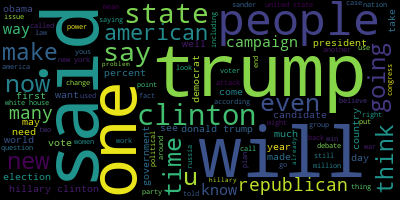

In [69]:
wordcloud = create_word_cloud(data_fake_real, 'text')
wordcloud.to_image()

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=t

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:520: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  Image.ROTATE_90)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordclo

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=trans

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
C:\Users\Mays

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=t

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=t

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=t

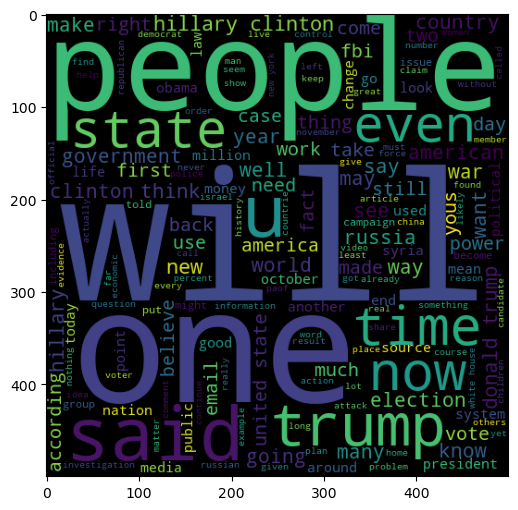

In [70]:
wc = WordCloud(width=500,height=500,min_font_size=10,background_color='black')
FAKE = wc.generate(data_fake_real[data_fake_real['label'] == 'FAKE']['text'].str.cat(sep=" "))
plt.figure(figsize=(15,6))
plt.imshow(FAKE)

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=t

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:519: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = (Image.ROTATE_90 if orientation is None else
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=t

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=trans

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mays

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mays

C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:499: DeprecationWarning: ROTATE_90 is deprecated and will be removed in Pillow 10 (2023-07-01). Use Transpose.ROTATE_90 instead.
  orientation = Image.ROTATE_90
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mayssa\anaconda3\lib\site-packages\wordcloud\wordcloud.py:508: DeprecationWarning: textsize is deprecated and will be removed in Pillow 10 (2023-07-01). Use textbbox or textlength instead.
  box_size = draw.textsize(word, font=transposed_font)
C:\Users\Mays

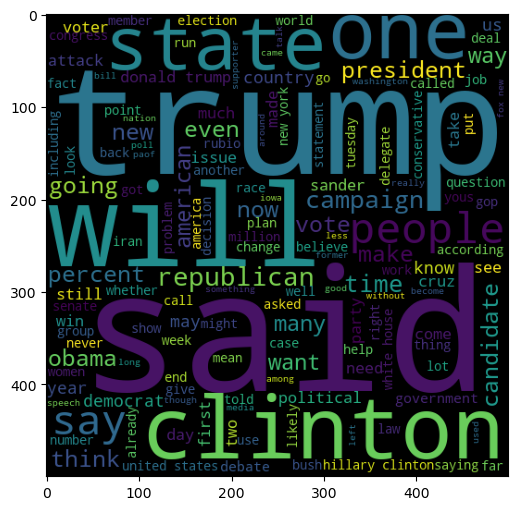

In [71]:
wc = WordCloud(width=500,height=500,min_font_size=10,background_color='black')
REAL = wc.generate(data_fake_real[data_fake_real['label'] == 'REAL']['text'].str.cat(sep=" "))
plt.figure(figsize=(15,6))
plt.imshow(REAL)

## Text Preprocessing:

### Tokenization

In [71]:
stop_words.extend(['has', 'been', 're', 'com', 'edu', 'use'])

In [72]:
# If you set deacc=True which will removes the punctuations (that we already removed)
def convert_sentences_to_words(sentences):
    for sentence in sentences:        
        yield(gensim.utils.simple_preprocess(str(sentence), deacc=True))

In [73]:
text_to_list = data_fake_real.text.values.tolist()

In [74]:
len(text_to_list)

6341

In [75]:
text_as_words = list(convert_sentences_to_words(text_to_list))

In [76]:
print(text_as_words[0])

['daniel', 'greenfield', 'shillman', 'journalism', 'fellow', 'at', 'the', 'freedom', 'center', 'is', 'new', 'york', 'writer', 'focusing', 'on', 'radical', 'islam', 'in', 'the', 'final', 'stretch', 'of', 'the', 'election', 'hillary', 'rodham', 'clinton', 'has', 'gone', 'to', 'war', 'with', 'the', 'fbi', 'the', 'word', 'unprecedented', 'has', 'been', 'thrown', 'around', 'so', 'often', 'this', 'election', 'that', 'it', 'ought', 'to', 'be', 'retired', 'but', 'it', 'is', 'still', 'unprecedented', 'for', 'the', 'nominee', 'of', 'major', 'political', 'party', 'to', 'go', 'war', 'with', 'the', 'fbi', 'but', 'that', 'is', 'exactly', 'what', 'hillary', 'and', 'her', 'people', 'have', 'done', 'coma', 'patients', 'just', 'waking', 'up', 'now', 'and', 'watching', 'an', 'hour', 'of', 'cnn', 'from', 'their', 'hospital', 'beds', 'would', 'assume', 'that', 'fbi', 'director', 'james', 'comey', 'is', 'hillarys', 'opponent', 'in', 'this', 'election', 'the', 'fbi', 'is', 'under', 'attack', 'by', 'everyone'

### Remove Stop Words


In [77]:
def remove_all_stop_words(texts):
    return [[word for word in simple_preprocess(str(doc)) 
             if word not in stop_words] for doc in texts]

In [78]:
clean_words = remove_all_stop_words(text_as_words)

In [79]:
print(clean_words[0])

['daniel', 'greenfield', 'shillman', 'journalism', 'fellow', 'freedom', 'center', 'new', 'york', 'writer', 'focusing', 'radical', 'islam', 'final', 'stretch', 'election', 'hillary', 'rodham', 'clinton', 'gone', 'war', 'fbi', 'word', 'unprecedented', 'thrown', 'around', 'often', 'election', 'ought', 'retired', 'still', 'unprecedented', 'nominee', 'major', 'political', 'party', 'go', 'war', 'fbi', 'exactly', 'hillary', 'people', 'done', 'coma', 'patients', 'waking', 'watching', 'hour', 'cnn', 'hospital', 'beds', 'would', 'assume', 'fbi', 'director', 'james', 'comey', 'hillarys', 'opponent', 'election', 'fbi', 'attack', 'everyone', 'obama', 'cnn', 'hillarys', 'people', 'circulated', 'letter', 'attacking', 'comey', 'currently', 'media', 'hit', 'pieces', 'lambasting', 'targeting', 'trump', 'would', 'surprising', 'clintons', 'allies', 'starunning', 'attack', 'ads', 'fbi', 'fbis', 'leadership', 'warned', 'entire', 'leftwing', 'establishment', 'form', 'lynch', 'mob', 'continue', 'going', 'hill

## Bigram / Lemmatization


In [80]:
bigram = gensim.models.Phrases(clean_words, min_count=5, threshold=100) 
bigram_mod = gensim.models.phrases.Phraser(bigram)

collecting all words and their counts
PROGRESS: at sentence #0, processed 0 words and 0 word types
collected 1768958 token types (unigram + bigrams) from a corpus of 2640898 words and 6341 sentences
merged Phrases<1768958 vocab, min_count=5, threshold=100, max_vocab_size=40000000>
Phrases lifecycle event {'msg': 'built Phrases<1768958 vocab, min_count=5, threshold=100, max_vocab_size=40000000> in 6.02s', 'datetime': '2023-02-26T14:57:15.867388', 'gensim': '4.1.2', 'python': '3.9.13 (main, Aug 25 2022, 23:51:50) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}
exporting phrases from Phrases<1768958 vocab, min_count=5, threshold=100, max_vocab_size=40000000>
FrozenPhrases lifecycle event {'msg': 'exported FrozenPhrases<7060 phrases, min_count=5, threshold=100> from Phrases<1768958 vocab, min_count=5, threshold=100, max_vocab_size=40000000> in 5.20s', 'datetime': '2023-02-26T14:57:21.065158', 'gensim': '4.1.2', 'python': '3.9.13 (main, Aug 25 2022

In [81]:
def make_bigrams(texts):
    return [bigram_mod[doc] for doc in texts]

In [82]:
def lemmatization(texts, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV']):
    """https://spacy.io/api/annotation"""
    texts_out = []
    for sent in texts:
        doc = nlp(" ".join(sent)) 
        texts_out.append([token.lemma_ for token in doc if token.pos_ in allowed_postags])
    return texts_out

In [98]:
import spacy
spacy.load("en_core_web_sm")
nlp = spacy.load('en_core_web_sm',disable=['parser', 'ner'])

OSError: [E050] Can't find model 'en_core_web_sm'. It doesn't seem to be a Python package or a valid path to a data directory.

In [99]:
python -m spacy download en_core_web_sm

SyntaxError: invalid syntax (581980377.py, line 1)

In [347]:
clean_words_bigrams = make_bigrams(clean_words)

In [349]:
clean_words_bigrams[0]

['daniel_greenfield',
 'shillman',
 'journalism',
 'fellow',
 'freedom',
 'center',
 'new_york',
 'writer',
 'focusing',
 'radical_islam',
 'final_stretch',
 'election',
 'hillary_rodham',
 'clinton',
 'gone',
 'war',
 'fbi',
 'word',
 'unprecedented',
 'thrown',
 'around',
 'often',
 'election',
 'ought',
 'retired',
 'still',
 'unprecedented',
 'nominee',
 'major',
 'political',
 'party',
 'go',
 'war',
 'fbi',
 'exactly',
 'hillary',
 'people',
 'done',
 'coma',
 'patients',
 'waking',
 'watching',
 'hour',
 'cnn',
 'hospital',
 'beds',
 'would',
 'assume',
 'fbi_director',
 'james_comey',
 'hillarys',
 'opponent',
 'election',
 'fbi',
 'attack',
 'everyone',
 'obama',
 'cnn',
 'hillarys',
 'people',
 'circulated',
 'letter',
 'attacking',
 'comey',
 'currently',
 'media',
 'hit',
 'pieces',
 'lambasting',
 'targeting',
 'trump',
 'would',
 'surprising',
 'clintons',
 'allies',
 'starunning',
 'attack',
 'ads',
 'fbi',
 'fbis',
 'leadership',
 'warned',
 'entire',
 'leftwing',
 'est

In [350]:
clean_words_lemmatized = lemmatization(clean_words_bigrams, allowed_postags=['NOUN', 'ADJ', 'VERB', 'ADV'])

In [351]:
clean_words_lemmatized[0]

['shillman',
 'journalism',
 'fellow',
 'new_york',
 'writer',
 'focus',
 'final_stretch',
 'election',
 'go',
 'war',
 'word',
 'unprecedented',
 'throw',
 'around',
 'often',
 'election',
 'retire',
 'still',
 'unprecedented',
 'nominee',
 'major',
 'political',
 'party',
 'go',
 'exactly',
 'people',
 'do',
 'coma',
 'patient',
 'wake',
 'watch',
 'hour',
 'hospital',
 'bed',
 'assume',
 'fbi_director',
 'opponent',
 'attack',
 'people',
 'circulate',
 'letter',
 'attack',
 'currently',
 'medium',
 'hit',
 'piece',
 'lambaste',
 'target',
 'trump',
 'surprising',
 'clinton',
 'ally',
 'starunne',
 'attack',
 'ad',
 'fbis',
 'leadership',
 'warn',
 'entire',
 'leftwe',
 'establishment',
 'form',
 'continue',
 'go',
 'attack',
 'medium',
 'preemptively',
 'head',
 'result',
 'people',
 'go',
 'explosively',
 'public',
 'new_york',
 'time',
 'compare',
 'comey',
 'edgar_hoover',
 'bizarre',
 'headline',
 'role',
 'recall',
 'hoover',
 'fairly',
 'practically',
 'admit',
 'front',
 'spo

### Analyze Fake or Real

In [352]:
data_Mytext = pd.DataFrame({'text': clean_words_lemmatized})

In [353]:
data_Mytext['text'] = data_Mytext['text'].apply(lambda x: ' '.join(x))

In [354]:
data_fake_real['text']=data_Mytext['text']

In [355]:
#we will work on fake
fake_corpus = []
for msg in data_fake_real[data_fake_real['label'] == "FAKE"]['text'].tolist():
    for word in msg.split():
        fake_corpus.append(word)

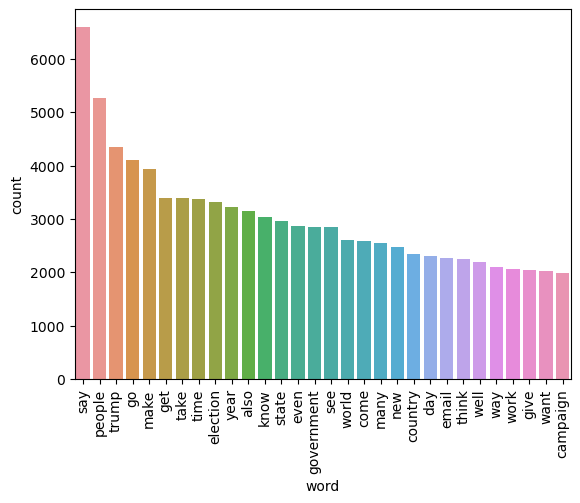

In [356]:
# count the frequency of each word in fake_corpus
word_counts = Counter(fake_corpus).most_common(30)

# create a DataFrame from word_counts
df_word_counts = pd.DataFrame(word_counts, columns=['word', 'count'])

# create a barplot using seaborn
sns.barplot(x='word', y='count', data=df_word_counts)

# rotate x-axis labels
plt.xticks(rotation='vertical')

# show the plot
plt.show()

In [357]:
#we will work on real
real_corpus = []
for msg in data_fake_real[data_fake_real['label'] == "REAL"]['text'].tolist():
    for word in msg.split():
        real_corpus.append(word)

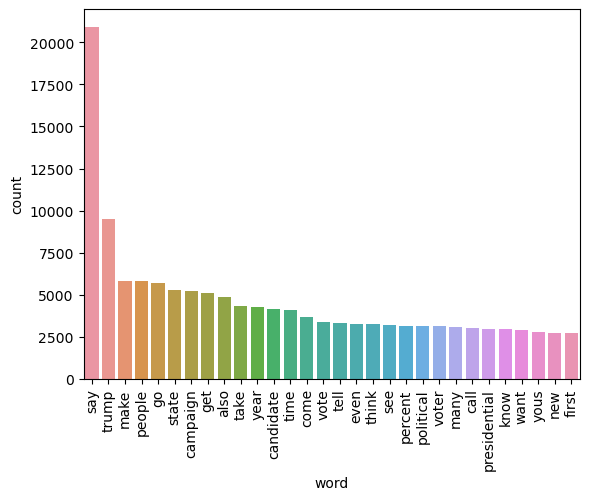

In [358]:
# count the frequency of each word in fake_corpus
word_counts = Counter(real_corpus).most_common(30)

# create a DataFrame from word_counts
df_word_counts = pd.DataFrame(word_counts, columns=['word', 'count'])

# create a barplot using seaborn
sns.barplot(x='word', y='count', data=df_word_counts)

# rotate x-axis labels
plt.xticks(rotation='vertical')

# show the plot
plt.show()

### Part of Speech Tagging (POS Tagging):

In [359]:
def pos_tagging_nltk(tokens):
    return [nltk.pos_tag(w) for w in tokens if w]

In [360]:
pos_tagging_nltk(clean_words_lemmatized)

[[('shillman', 'JJ'),
  ('journalism', 'NN'),
  ('fellow', 'JJ'),
  ('new_york', 'NN'),
  ('writer', 'NN'),
  ('focus', 'NN'),
  ('final_stretch', 'NN'),
  ('election', 'NN'),
  ('go', 'VBP'),
  ('war', 'NN'),
  ('word', 'NN'),
  ('unprecedented', 'JJ'),
  ('throw', 'NN'),
  ('around', 'RB'),
  ('often', 'RB'),
  ('election', 'NN'),
  ('retire', 'NN'),
  ('still', 'RB'),
  ('unprecedented', 'VBD'),
  ('nominee', 'JJ'),
  ('major', 'JJ'),
  ('political', 'JJ'),
  ('party', 'NN'),
  ('go', 'VBP'),
  ('exactly', 'RB'),
  ('people', 'NNS'),
  ('do', 'VBP'),
  ('coma', 'VB'),
  ('patient', 'JJ'),
  ('wake', 'NN'),
  ('watch', 'VB'),
  ('hour', 'NN'),
  ('hospital', 'NN'),
  ('bed', 'VBD'),
  ('assume', 'JJ'),
  ('fbi_director', 'NN'),
  ('opponent', 'JJ'),
  ('attack', 'NN'),
  ('people', 'NNS'),
  ('circulate', 'VBP'),
  ('letter', 'NN'),
  ('attack', 'NN'),
  ('currently', 'RB'),
  ('medium', 'RBS'),
  ('hit', 'VBN'),
  ('piece', 'JJ'),
  ('lambaste', 'NN'),
  ('target', 'NN'),
  ('trump'

## Tokenizing

In [361]:
id2word = corpora.Dictionary(clean_words_lemmatized)

adding document #0 to Dictionary<0 unique tokens: []>
built Dictionary<85902 unique tokens: ['abuse', 'accuse', 'act', 'ad', 'admit']...> from 6333 documents (total 1974964 corpus positions)
Dictionary lifecycle event {'msg': "built Dictionary<85902 unique tokens: ['abuse', 'accuse', 'act', 'ad', 'admit']...> from 6333 documents (total 1974964 corpus positions)", 'datetime': '2023-02-25T12:21:26.849756', 'gensim': '4.2.0', 'python': '3.9.15 (main, Nov 24 2022, 14:39:17) [MSC v.1916 64 bit (AMD64)]', 'platform': 'Windows-10-10.0.22621-SP0', 'event': 'created'}


In [362]:
texts = clean_words_lemmatized

In [363]:
corpus = [id2word.doc2bow(text) for text in texts]

In [364]:
print(corpus[0])

[(0, 1), (1, 3), (2, 2), (3, 1), (4, 1), (5, 3), (6, 1), (7, 1), (8, 1), (9, 1), (10, 1), (11, 1), (12, 1), (13, 2), (14, 2), (15, 2), (16, 1), (17, 1), (18, 1), (19, 1), (20, 1), (21, 1), (22, 1), (23, 2), (24, 1), (25, 1), (26, 2), (27, 1), (28, 5), (29, 1), (30, 1), (31, 2), (32, 1), (33, 1), (34, 1), (35, 1), (36, 1), (37, 1), (38, 2), (39, 1), (40, 2), (41, 3), (42, 2), (43, 1), (44, 1), (45, 1), (46, 1), (47, 1), (48, 1), (49, 1), (50, 1), (51, 1), (52, 6), (53, 1), (54, 1), (55, 1), (56, 1), (57, 1), (58, 3), (59, 1), (60, 2), (61, 2), (62, 1), (63, 1), (64, 1), (65, 1), (66, 7), (67, 1), (68, 1), (69, 2), (70, 1), (71, 1), (72, 1), (73, 1), (74, 1), (75, 2), (76, 1), (77, 2), (78, 1), (79, 1), (80, 1), (81, 1), (82, 1), (83, 1), (84, 1), (85, 3), (86, 1), (87, 1), (88, 1), (89, 1), (90, 2), (91, 1), (92, 1), (93, 1), (94, 1), (95, 1), (96, 1), (97, 1), (98, 1), (99, 2), (100, 1), (101, 1), (102, 4), (103, 2), (104, 1), (105, 1), (106, 1), (107, 1), (108, 1), (109, 1), (110, 2),

## Topic Model

In [365]:
num_topics = 10

In [366]:
# Using Gensin to build the LDA model
lda_model = gensim.models.LdaMulticore(corpus=corpus, 
                                       id2word=id2word, 
                                       num_topics=num_topics,
                                       )

using symmetric alpha at 0.1
using symmetric eta at 0.1
using serial LDA version on this node
running online LDA training, 10 topics, 1 passes over the supplied corpus of 6333 documents, updating every 14000 documents, evaluating every ~6333 documents, iterating 50x with a convergence threshold of 0.001000
too few updates, training might not converge; consider increasing the number of passes or iterations to improve accuracy
training LDA model using 7 processes
PROGRESS: pass 0, dispatched chunk #0 = documents up to #2000/6333, outstanding queue size 1
PROGRESS: pass 0, dispatched chunk #1 = documents up to #4000/6333, outstanding queue size 2
PROGRESS: pass 0, dispatched chunk #2 = documents up to #6000/6333, outstanding queue size 3
PROGRESS: pass 0, dispatched chunk #3 = documents up to #6333/6333, outstanding queue size 4
topic #1 (0.100): 0.012*"say" + 0.005*"make" + 0.005*"also" + 0.005*"trump" + 0.005*"state" + 0.004*"go" + 0.004*"people" + 0.004*"year" + 0.004*"time" + 0.004*"c

In [367]:
# Print the Keyword in the N (=num_topics) topics
from pprint import pprint
pprint(lda_model.print_topics())
#pprint(lda_model.print_topics(N))

topic #0 (0.100): 0.009*"say" + 0.009*"people" + 0.008*"trump" + 0.005*"make" + 0.005*"campaign" + 0.005*"go" + 0.004*"get" + 0.004*"year" + 0.004*"even" + 0.004*"also"
topic #1 (0.100): 0.012*"say" + 0.005*"make" + 0.005*"also" + 0.005*"trump" + 0.005*"state" + 0.004*"go" + 0.004*"people" + 0.004*"year" + 0.004*"time" + 0.004*"campaign"
topic #2 (0.100): 0.014*"say" + 0.007*"trump" + 0.006*"people" + 0.006*"get" + 0.006*"go" + 0.005*"know" + 0.005*"state" + 0.005*"time" + 0.005*"also" + 0.004*"campaign"
topic #3 (0.100): 0.015*"say" + 0.005*"make" + 0.005*"people" + 0.005*"trump" + 0.005*"go" + 0.004*"take" + 0.004*"year" + 0.004*"get" + 0.003*"state" + 0.003*"time"
topic #4 (0.100): 0.018*"say" + 0.006*"trump" + 0.005*"people" + 0.005*"state" + 0.005*"take" + 0.004*"make" + 0.004*"campaign" + 0.004*"go" + 0.003*"tell" + 0.003*"year"
topic #5 (0.100): 0.009*"say" + 0.007*"trump" + 0.006*"go" + 0.005*"make" + 0.004*"people" + 0.004*"candidate" + 0.004*"take" + 0.003*"get" + 0.003*"time

[(0,
  '0.009*"say" + 0.009*"people" + 0.008*"trump" + 0.005*"make" + '
  '0.005*"campaign" + 0.005*"go" + 0.004*"get" + 0.004*"year" + 0.004*"even" + '
  '0.004*"also"'),
 (1,
  '0.012*"say" + 0.005*"make" + 0.005*"also" + 0.005*"trump" + 0.005*"state" + '
  '0.004*"go" + 0.004*"people" + 0.004*"year" + 0.004*"time" + '
  '0.004*"campaign"'),
 (2,
  '0.014*"say" + 0.007*"trump" + 0.006*"people" + 0.006*"get" + 0.006*"go" + '
  '0.005*"know" + 0.005*"state" + 0.005*"time" + 0.005*"also" + '
  '0.004*"campaign"'),
 (3,
  '0.015*"say" + 0.005*"make" + 0.005*"people" + 0.005*"trump" + 0.005*"go" + '
  '0.004*"take" + 0.004*"year" + 0.004*"get" + 0.003*"state" + 0.003*"time"'),
 (4,
  '0.018*"say" + 0.006*"trump" + 0.005*"people" + 0.005*"state" + 0.005*"take" '
  '+ 0.004*"make" + 0.004*"campaign" + 0.004*"go" + 0.003*"tell" + '
  '0.003*"year"'),
 (5,
  '0.009*"say" + 0.007*"trump" + 0.006*"go" + 0.005*"make" + 0.004*"people" + '
  '0.004*"candidate" + 0.004*"take" + 0.003*"get" + 0.003*

In [368]:
for i, topic in lda_model.show_topics(num_topics=10, num_words=10, formatted=False):
    print("Topic {}: {}".format(i, " ".join([word for word, _ in topic])))

Topic 0: say people trump make campaign go get year even also
Topic 1: say make also trump state go people year time campaign
Topic 2: say trump people get go know state time also campaign
Topic 3: say make people trump go take year get state time
Topic 4: say trump people state take make campaign go tell year
Topic 5: say trump go make people candidate take get time even
Topic 6: say trump make state go people take year also time
Topic 7: say trump get people go take make also year candidate
Topic 8: say trump people make also yous go take state get
Topic 9: say trump go election vote people get time state campaign


In [369]:
doc_lda = lda_model[corpus]

In [370]:
doc_lda

# Analyzing the LDA Model

In [371]:
# Visualize the topics
pyLDAvis.enable_notebook()

In [372]:
LDAvis_data_filepath = os.path.join('ldavis_prepared_'+str(num_topics))

In [373]:
# # this is a bit time consuming - make the if statement True
# # if you want to execute visualization prep yourself
if 1 == 1:
    LDAvis_prepared = pyLDAvis.gensim_models.prepare(lda_model, corpus, id2word)
    with open(LDAvis_data_filepath, 'wb') as f:
        pickle.dump(LDAvis_prepared, f)

In [374]:
# load the pre-prepared pyLDAvis data from disk
with open(LDAvis_data_filepath, 'rb') as f:
    LDAvis_prepared = pickle.load(f)

In [375]:
pyLDAvis.save_html(LDAvis_prepared, 'ldavis_prepared_'+ str(num_topics) +'.html')

In [376]:
LDAvis_prepared 

PreparedData(topic_coordinates=              x         y  topics  cluster       Freq
topic                                                
2      0.002857 -0.003320       1        1  18.973190
0      0.000396  0.003972       2        1  15.791248
6     -0.000046  0.000841       3        1  13.400165
1     -0.002929  0.004302       4        1  13.036880
9      0.004928 -0.007096       5        1  10.771410
3     -0.008791  0.001554       6        1   9.644930
8     -0.006242 -0.002966       7        1   7.448443
4     -0.001673 -0.004759       8        1   5.183740
7      0.005661  0.005183       9        1   2.967894
5      0.005839  0.002289      10        1   2.782099, topic_info=           Term          Freq         Total Category  logprob  loglift
425         say  26332.000000  26332.000000  Default  30.0000  30.0000
313       trump  13239.000000  13239.000000  Default  29.0000  29.0000
396        make   9280.000000   9280.000000  Default  28.0000  28.0000
138          go   9512.000000   9512.000000  Default  27.0000  27.0000
299        take   7240.000000   7240.000000  Default  26.0000  26.0000
..          ...           ...           ...      ...      ...      ...
538       state    163.921855   8113.311862  Topic10  -5.8147  -0.3199
578  government    134.269092   5210.093347  Topic10  -6.0143  -0.0765
52     campaign    147.925938   7129.972723  Topic10  -5.9174  -0.2934
15         also    141.121963   7972.377169  Topic10  -5.9645  -0.4521
399        many    125.555558   5440.362811  Topic10  -6.0813  -0.1869

[828 rows x 6 columns], token_table=       Topic      Freq        Term
term                              
4392       5  0.513392  acresworth
41159      7  0.591372     actualy
3          1  0.212449          ad
3          2  0.272829          ad
3          3  0.098398          ad
...      ...       ...         ...
552        8  0.046129        yous
552        9  0.017134        yous
552       10  0.022625        yous
79510      5  0.513189    youtuber
31347      7  0.593243         zog

[2206 rows x 3 columns], R=30, lambda_step=0.01, plot_opts={'xlab': 'PC1', 'ylab': 'PC2'}, topic_order=[3, 1, 7, 2, 10, 4, 9, 5, 8, 6])

# Model Building

In [76]:
from sklearn.preprocessing import LabelEncoder
encoder = LabelEncoder()

data_fake_real['label'] = encoder.fit_transform(data_fake_real['label'])

In [77]:
from sklearn.feature_extraction.text import CountVectorizer,TfidfVectorizer
cv = CountVectorizer()
tfidf = TfidfVectorizer(max_features=10000)

In [79]:
X = tfidf.fit_transform(data_fake_real['text']).toarray()
y=data_fake_real['label']

In [80]:
from sklearn.model_selection import train_test_split
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.2,random_state=2)

In [81]:
from sklearn.metrics import accuracy_score,confusion_matrix,precision_score
from sklearn.metrics import classification_report
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import AdaBoostClassifier
from sklearn.ensemble import BaggingClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier

In [82]:
svc = SVC(kernel='sigmoid', gamma=1.0)
knc = KNeighborsClassifier()
mnb = MultinomialNB()
dtc = DecisionTreeClassifier(max_depth=5)
lrc = LogisticRegression(solver='liblinear', penalty='l1')
rfc = RandomForestClassifier(n_estimators=50, random_state=2)
abc = AdaBoostClassifier(n_estimators=50, random_state=2)
bc = BaggingClassifier(n_estimators=50, random_state=2)
etc = ExtraTreesClassifier(n_estimators=50, random_state=2)
gbdt = GradientBoostingClassifier(n_estimators=50,random_state=2)
xgb = XGBClassifier(n_estimators=50,random_state=2)

In [83]:
clfs = {
    'SVC' : svc,
    'KN' : knc, 
    'NB': mnb, 
    'DT': dtc, 
    'LR': lrc, 
    'RF': rfc, 
    'AdaBoost': abc, 
    'BgC': bc, 
    'ETC': etc,
    'GBDT':gbdt,
    'xgb':xgb
}

In [84]:
def train_classifier(clf,X_train,y_train,X_test,y_test):
    clf.fit(X_train,y_train)
    y_pred = clf.predict(X_test)
    accuracy = accuracy_score(y_test,y_pred)
    precision = precision_score(y_test,y_pred)
    report = classification_report(y_test, y_pred)

    return accuracy,precision,report

In [1]:
accuracy_scores = []
precision_scores = []
report_score=[]  

for name,clf in clfs.items():
    
    current_accuracy,current_precision,report = train_classifier(clf, X_train,y_train,X_test,y_test)
    
    print("For :",name)
    print(report)
    print("********************************")
    

For : SVC
              precision    recall  f1-score   support

           0       0.91      0.93      0.92       631
           1       0.93      0.90      0.92       631

    accuracy                           0.92      1262
   macro avg       0.92      0.92      0.92      1262
weighted avg       0.92      0.92      0.92      1262

********************************
For : KN
              precision    recall  f1-score   support

           0       0.72      0.93      0.81       631
           1       0.90      0.64      0.75       631

    accuracy                           0.78      1262
   macro avg       0.81      0.78      0.78      1262
weighted avg       0.81      0.78      0.78      1262

********************************
For : NB
              precision    recall  f1-score   support

           0       0.90      0.88      0.89       631
           1       0.88      0.90      0.89       631

    accuracy                           0.89      1262
   macro avg       0.89      0.89 

In [101]:
performance_df = pd.DataFrame({'Algorithm':clfs.keys(),'Accuracy':accuracy_scores,'Precision':precision_scores}).sort_values('Precision',ascending=False)

In [102]:
performance_df

,Algorithm,Accuracy,Precision
10,xgb,0.919495,0.928000
4,LR,0.907656,0.910095
0,SVC,0.894238,0.906300
8,ETC,0.883978,0.895161
5,RF,0.877664,0.889968
2,NB,0.861089,0.884808
9,GBDT,0.866614,0.881107
6,AdaBoost,0.857932,0.872757
7,BgC,0.867403,0.868132
1,KN,0.812944,0.836700


In [106]:
from sklearn.metrics import confusion_matrix
y_pred = mnb.predict(X_test)
CM = confusion_matrix(y_test, y_pred)
CM

array([[561,  69],
       [107, 530]], dtype=int64)

In [75]:
bool_series = data_fake_real.duplicated()
bool_series
print(bool_series.describe())
data_fake_real.index.is_unique

count      6331
unique        2
top       False
freq       6330
dtype: object


True

In [111]:
from sklearn.metrics import classification_report

print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.84      0.89      0.86       630
           1       0.88      0.83      0.86       637

    accuracy                           0.86      1267
   macro avg       0.86      0.86      0.86      1267
weighted avg       0.86      0.86      0.86      1267



In [1]:
from imblearn.over_sampling import SMOTE
oversample = SMOTE()
x_train_res, y_train_res = oversample.fit_resample(X_train, y_train)